## Gravitational Waves

Gravitational waves are ripples in space which can be associated with events
such as black holes and exploding stars when cataclysmic waves are detected.
Humans can’t see these gravitational waves, but with the help of antennas such
as LIGO (Laser Interferometer Gravitational-Wave), it can detect vibrations in the
medium of space. The medium of space is something scientists are still
researching to this day and could play an important role in telling us more about
what is in the universe.
The current approaches include techniques for improving the sensitivity of
Advanced Laser Interferometer GW Observatory and Advanced Virgo GW
searches, methods for fast measurements of the astrophysical parameters of


## Installing and importing necessary dependancies

In [ ]:
!pip install riroriro
!pip install visualkeras
!pip install git+https://github.com/PyFstat/PyFstat@python37
!pip install -U dataprep

In [2]:
import os
import h5py
import gc
import glob
import math
import random
import warnings
import pyfstat
import librosa
import librosa.display
import numpy as np
import pandas as pd
import seaborn as sns


import visualkeras
import riroriro.inspiralfuns as ins
import riroriro.mergerfirstfuns as me1
import riroriro.matchingfuns as mat
import riroriro.mergersecondfuns as me2
import tensorflow as tf
from scipy.signal import istft
from tensorflow.keras import regularizers
from tensorflow.keras import layers
import tensorflow_addons as tfa

from pathlib import Path
from scipy import stats
from tqdm.notebook import tqdm
from scipy import signal
import matplotlib.pyplot as plt
from IPython.display import HTML, display
from tensorflow.keras.utils import plot_model
from sklearn.model_selection   import train_test_split

from dataprep.eda import *

sns.set_theme()
%matplotlib inline 

In [3]:
DATA_PATH = Path('../input/g2net-detecting-continuous-gravitational-waves')
TRAIN_PATH = DATA_PATH/'train'
TEST_PATH = DATA_PATH/'test'

train_example_with_signal_path = TRAIN_PATH/'cc561e4fc.hdf5'
train_example_without_signal_path = TRAIN_PATH/'fb6db0d08.hdf5'


## HDF5 files exploration

* Datasets, which are typed multidimensional arrays
* Groups, which are container structures that can hold datasets and other groups

## Our dataset structures

* <b>ID</b> is the top of the HDF5 file and links the datapoint id to it's label in the train_labels csv
* <b>frequency_Hz</b> contains the range frequencies measured by the two gravitational wave dectors
* <b>H1</b> contains the data for the LIGO Hanford decector (group)
        - SFTs is the Short-time Fourier Transforms amplitudes for each timestamp at each frequency (dataset)
        - timestamps contains the timestamps for the measurement (dataset)

* <b>L1</b> contains the data for the LIGO Livingston decector (group)
        - SFTs is the Short-time Fourier Transforms amplitudes for each timestamp at each frequency (dataset)
        - timestamps contains the timestamps for the measurement (dataset)

## Loading data

In [4]:
labels_df = pd.read_csv('../input/g2net-detecting-continuous-gravitational-waves/train_labels.csv')
labels_df.head()

,id,target
0,001121a05,1
1,004f23b2d,1
2,00a6db666,1
3,00f36a6ac,1
4,010a387db,1


In [5]:
labels_df.shape

(603, 2)

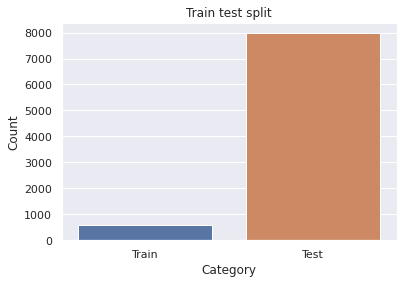

In [6]:
plt.figure(figsize=(6,4))
sns.barplot(['Train', 'Test'], [len(os.listdir(TRAIN_PATH)), len(os.listdir(TEST_PATH))]);
plt.title(f'Train test split', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xlabel('Category', fontsize=12)
plt.show()

There is a skew between the training and testing dataset. The target labels; 1 if the data contains the presence of a gravitational wave, 0 otherwise.

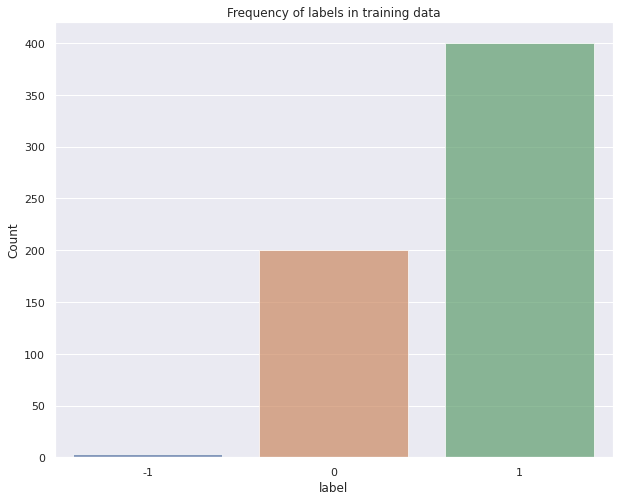

In [7]:
label_count  = labels_df['target'].value_counts()
plt.figure(figsize=(10,8))
sns.barplot(label_count.index, label_count.values, alpha=0.7)
plt.title(f'Frequency of labels in training data', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xlabel('label', fontsize=12)
plt.show()

## Spectogram analysis
Spectrograms are used extensively in the fields of music, linguistics, sonar, radar, speech processing, seismology, and others, usually to identify sounds


In [8]:
df1 = pd.read_csv('../input/g2net-detecting-continuous-gravitational-waves/sample_submission.csv')
df2 = pd.read_csv('../input/g2net-detecting-continuous-gravitational-waves/train_labels.csv')
df = pd.concat((df1, df2[df2.target!=-1]), ignore_index=True)

dataset_file_mask = ('../input/g2net-detecting-continuous-gravitational-waves/test/%s.hdf5',
                     '../input/g2net-detecting-continuous-gravitational-waves/train/%s.hdf5')

In [9]:
def get_MA_SFT(n, MA=12):
    # Load `id` and `target` from dataframe
    id = df.iloc[n]['id']
    target = df.iloc[n]['target']

    # Get the hdf5 file name
    fname = dataset_file_mask[int(target!=0.5)] % id

    # Read the data from the file
    data = h5py.File(fname, 'r')[id]

    freqs = np.array(data['frequency_Hz'])
    ma_sft = {}
    for detector in ['L1', 'H1']:
        # Get the SFT values
        sft = np.array(data[detector]['SFTs'])*1e22

        # Transform them into power spectrum values
        power = np.power(np.abs(sft), 2)

        # Now calculate the moving average in every `MA` time points
        # For this we get the `cumsum` along the time axis and substract for every `MA` time points
        # The last block may not contain `MA` points, and it is ignored
        power_ma_cumsum = np.cumsum(power, axis=1)
        power_ma_cumsum_0 = np.concatenate((np.zeros((power.shape[0],1)), power_ma_cumsum), axis=1)[:,::MA]
        power_ma = np.diff(power_ma_cumsum_0, axis=1)[:,:-1]/MA
        ma_sft[detector] = power_ma
        
    return ma_sft, freqs

In [10]:
get_MA_SFT(0, MA = 12)

({'L1': array([[2.78080718, 2.74806817, 1.68772697, ..., 1.7578125 , 4.3922526 ,
          2.20898438],
         [1.85113144, 2.4553709 , 1.24435647, ..., 2.13574219, 2.39208984,
          1.95458984],
         [1.7920564 , 2.25244395, 1.08123239, ..., 3.33740234, 2.86971029,
          1.86889648],
         ...,
         [2.23781951, 1.64585479, 2.40049903, ..., 2.07568359, 2.40193685,
          1.85245768],
         [1.63601335, 1.99318314, 1.52731609, ..., 3.21264648, 3.17244466,
          1.30297852],
         [2.34311612, 1.96948274, 4.11073081, ..., 2.0218099 , 3.41772461,
          2.22810872]]),
  'H1': array([[2.41098086, 1.80256049, 2.68547853, ..., 1.77587891, 1.73958333,
          1.27579753],
         [3.17803129, 1.96097024, 2.25210349, ..., 2.14282227, 1.85424805,
          1.65340169],
         [3.16080411, 2.43968264, 1.24435298, ..., 1.94913737, 2.8754069 ,
          2.27140299],
         ...,
         [2.44937865, 2.76649443, 1.03155518, ..., 2.64453125, 1.99527995,
 

In [11]:
def test_record_view(id):
    # SFT with MA
    ma_sft, freqs = get_MA_SFT(id)

    fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(18,10))
    ax_names = ('Interval No', 'Frequency, Hz')
    for col, detector in enumerate(['L1', 'H1']):
        # Prepare the axes
        axs[0, col].set_title(f'Detector={detector}')
        axs[0, col].set_xlabel(ax_names[0])
        axs[0, col].set_ylabel(ax_names[1])
        axs[0, col].pcolormesh(range(ma_sft[detector].shape[1]), freqs, ma_sft[detector])

        for row in range(2):
            # Calculate mean value for each frequency or for each time interval
            x = np.mean(ma_sft[detector], axis=row)
            k2, p = stats.normaltest(x)

            axs[row+1, col].set_title(f'Detector={detector}; p-value={p:.3}')
            axs[row+1, col].set_xlabel(ax_names[row])
            if row==0:
                axs[row+1, col].plot(x)
            else:
                axs[row+1, col].plot(freqs, x)
                
    fig.tight_layout(pad=1.5)
    plt.show()

In [12]:
ids = df.index[df['target'] == 0].tolist()
print(ids)

[7982, 7986, 7988, 7995, 7998, 8006, 8011, 8012, 8016, 8017, 8018, 8019, 8022, 8023, 8024, 8029, 8030, 8031, 8036, 8042, 8044, 8047, 8048, 8049, 8052, 8056, 8063, 8064, 8065, 8066, 8075, 8076, 8081, 8084, 8085, 8086, 8087, 8091, 8092, 8094, 8096, 8098, 8099, 8100, 8102, 8103, 8105, 8107, 8113, 8115, 8117, 8119, 8120, 8125, 8129, 8132, 8139, 8150, 8152, 8155, 8159, 8160, 8165, 8175, 8176, 8177, 8185, 8188, 8191, 8195, 8196, 8197, 8199, 8205, 8209, 8213, 8215, 8216, 8218, 8219, 8239, 8241, 8246, 8247, 8251, 8252, 8253, 8254, 8256, 8257, 8259, 8261, 8263, 8269, 8270, 8272, 8278, 8279, 8281, 8283, 8285, 8288, 8291, 8295, 8298, 8301, 8308, 8310, 8315, 8317, 8325, 8328, 8329, 8332, 8337, 8341, 8343, 8346, 8347, 8350, 8351, 8353, 8354, 8358, 8359, 8372, 8374, 8375, 8377, 8382, 8383, 8387, 8388, 8393, 8395, 8396, 8402, 8405, 8406, 8410, 8411, 8412, 8417, 8420, 8422, 8424, 8426, 8427, 8428, 8430, 8431, 8435, 8437, 8438, 8439, 8441, 8442, 8443, 8445, 8450, 8454, 8464, 8466, 8467, 8469, 8482, 848

In [13]:
test = df.index[df['target'] == 1].tolist()
print(test)

[7975, 7976, 7977, 7978, 7979, 7980, 7981, 7983, 7984, 7985, 7987, 7989, 7990, 7991, 7992, 7993, 7994, 7996, 7997, 7999, 8000, 8001, 8002, 8003, 8004, 8005, 8007, 8008, 8009, 8010, 8013, 8014, 8015, 8020, 8021, 8025, 8026, 8027, 8028, 8032, 8033, 8034, 8035, 8037, 8038, 8039, 8040, 8041, 8043, 8045, 8046, 8050, 8051, 8053, 8054, 8055, 8057, 8058, 8059, 8060, 8061, 8062, 8067, 8068, 8069, 8070, 8071, 8072, 8073, 8074, 8077, 8078, 8079, 8080, 8082, 8083, 8088, 8089, 8090, 8093, 8095, 8097, 8101, 8104, 8106, 8108, 8109, 8110, 8111, 8112, 8114, 8116, 8118, 8121, 8122, 8123, 8124, 8126, 8127, 8128, 8130, 8131, 8133, 8134, 8135, 8136, 8137, 8138, 8140, 8141, 8142, 8143, 8144, 8145, 8146, 8147, 8148, 8149, 8151, 8153, 8154, 8156, 8157, 8158, 8161, 8162, 8163, 8164, 8166, 8167, 8168, 8169, 8170, 8171, 8172, 8173, 8174, 8178, 8179, 8180, 8181, 8182, 8183, 8184, 8186, 8187, 8189, 8190, 8192, 8193, 8194, 8198, 8200, 8201, 8202, 8203, 8204, 8206, 8207, 8208, 8210, 8211, 8212, 8214, 8217, 8220, 822

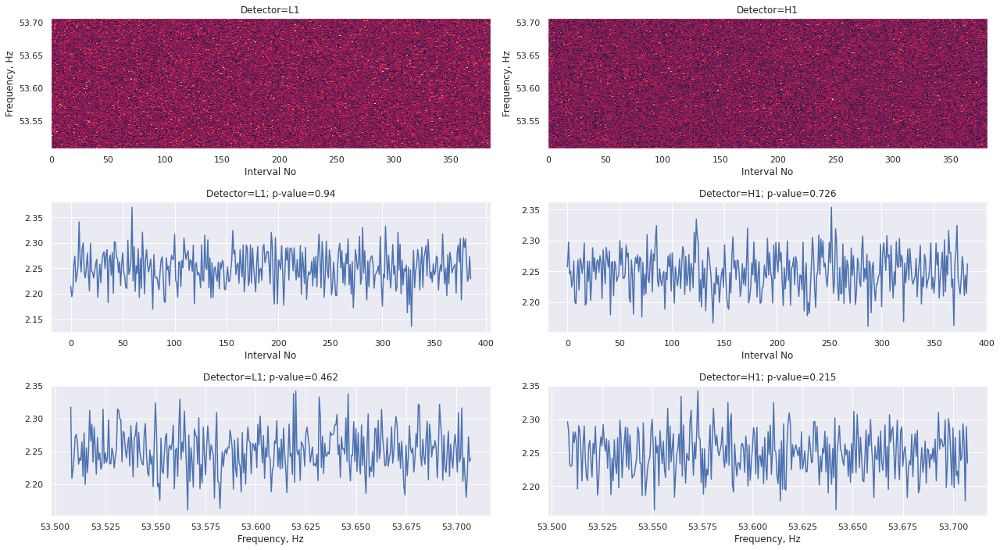

In [14]:
#signal with target = 1
test_record_view(id=7975)

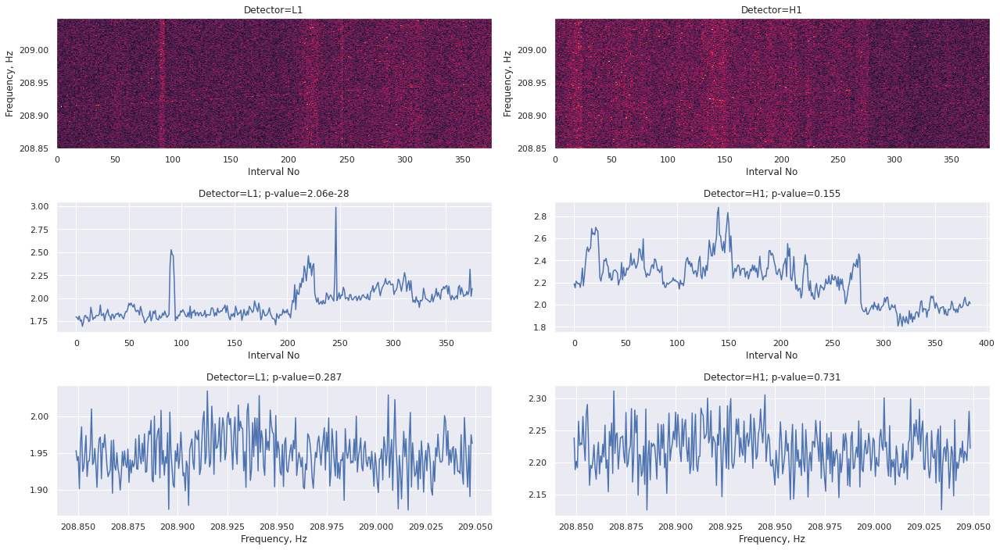

In [15]:
#signal with target = 0.5
test_record_view(id=609)

* This record contains a signal. At the same time the noise is not stationary.
* From the middle two graphs we can also see, that the noise is not stationary.
  P-value is low (2e-28) only for the left graph. For the right it is not so low (0.155), that we can reject the null hypothesis.
* From the bottom graphs we can say, it looks like white noise, and the corresponding p-values (0.287 and 0.731) are high.

Conclusion: **the record has non-gaussian noise background and may or may not contain a signal. We should keep our attention on it**

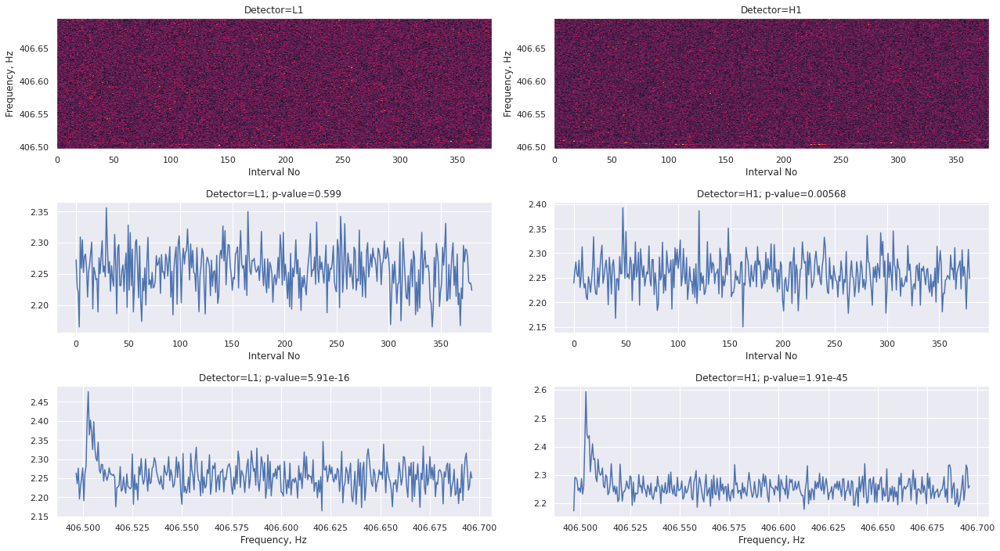

In [16]:
test_record_view(id=7850)

* This record contains a signal.
* From the middle two graphs we can see, that the noise is likely to be stationary at L1 and non-stationary at H1 (p-value is about 0.006).
* From the bottom graphs we can say, it is completly non-gaussian. The record may contain a signal.

Conclusion: **the record has non-gaussian noise background and may or may not contain a signal. We should keep our attention on it**

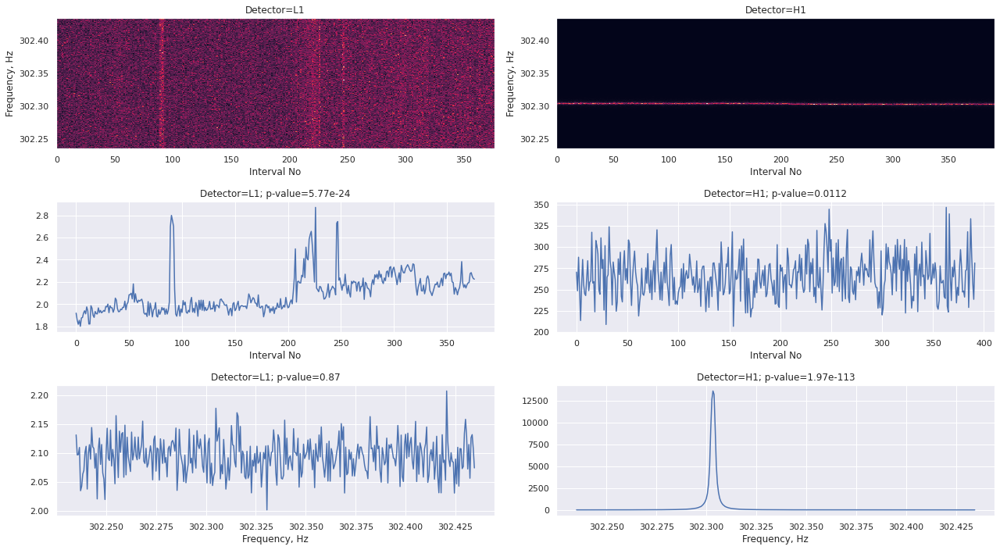

In [17]:
test_record_view(id=3283)

* We can't see the signal on the left upper graph. The right upper graph is something strange, because the signal is to strong. Also it doesn't have frequency gradient, possibly an interference. If strong signal on H1, we must had definitely registered it at L1;however, it isn't the same.
* From the middle left graph we can see, that the noise is not stationary at L1. The p-value is also low fow H1, but we need to exclude the interference first to make a conclusion here.
* From the bottom graphs we can clearly see the interference at H1.

Conclusion: **the record may or may not contain a signal, but could contain interference. **

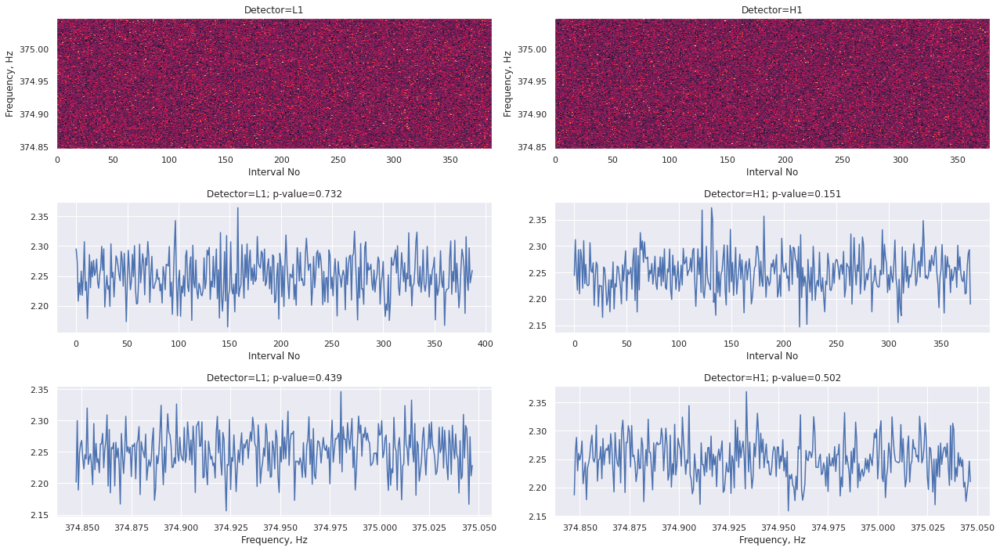

In [18]:
test_record_view(id=8100)

Conclusion: **The record is most likely white noise**.

In [19]:
def extract_data_from_hdf5(path, labels):
    '''
    Extracts data from hdf5 file and puts it into a dict. It also adds the label
    '''
    
    data = {}
    
    with h5py.File(path, "r") as f:

        ID_key = list(f.keys())[0]

        # Retrieve the frequency data
        data['freq'] = np.array(f[ID_key]['frequency_Hz'])

        # Retrieve the Livingston decector data
        data['L1_SFTs_amplitudes'] = np.array(f[ID_key]['L1']['SFTs'])
        data['L1_ts'] = np.array(f[ID_key]['L1']['timestamps_GPS'])

        # Retrieve the Hanford decector data
        data['H1_SFTs_amplitudes'] = np.array(f[ID_key]['H1']['SFTs'])
        data['H1_ts'] = np.array(f[ID_key]['H1']['timestamps_GPS'])
        
        # Get label from training labels if in training set
        data['label'] = labels.loc[labels.id==ID_key].target.item()
        
    return data

In [20]:
def extract_data_from_hdf5_reduced(path, labels):
    '''
    Extracts data from hdf5 file and puts it into a dict. It also adds the label
    '''
    
    data = {}
    
    with h5py.File(path, "r") as f:

        ID_key = list(f.keys())[0]

        # Retrieve the frequency data
        data['id'] = ID_key
        data['freq'] = np.array(f[ID_key]['frequency_Hz'])

        # Retrieve the Livingston decector data
        data['L1_ts'] = np.array(f[ID_key]['L1']['timestamps_GPS'])

        # Retrieve the Hanford decector data
        data['H1_ts'] = np.array(f[ID_key]['H1']['timestamps_GPS'])
        
        # Get label from training labels if in training set
        data['label'] = labels.loc[labels.id==ID_key].target.item()
        
    return data

In [21]:
def plot_spectograms(data):
    '''
    Shows the real and imaginary amplitudes of the SFTs as spectograms for both detectors
    '''
    
    fig, ax = plt.subplots(2, 2, figsize=(16, 10))
    fig.suptitle(f"Label {data['label']}")

    for ind, detector in enumerate(['L1', 'H1']):
        ax[ind][0].set(xlabel="Timestamps [GPS]",
                         ylabel="Frequency [Hz]",
                         title=f"{detector} - Real part")
        ax[ind][1].set(xlabel="Timestamps [GPS]",
                         ylabel="Frequency [Hz]",
                         title=f"{detector} - Imaginary part")
        
        
        c0 = ax[ind][0].pcolormesh(data[f"{detector}_ts"], data['freq'],
                                     data[f"{detector}_SFTs_amplitudes"].real)
        c1 = ax[ind][1].pcolormesh(data[f"{detector}_ts"], data['freq'],
                                     data[f"{detector}_SFTs_amplitudes"].imag)
    
        fig.colorbar(c0, ax=ax[ind][0])
        fig.colorbar(c1, ax=ax[ind][1])
        
    plt.show()

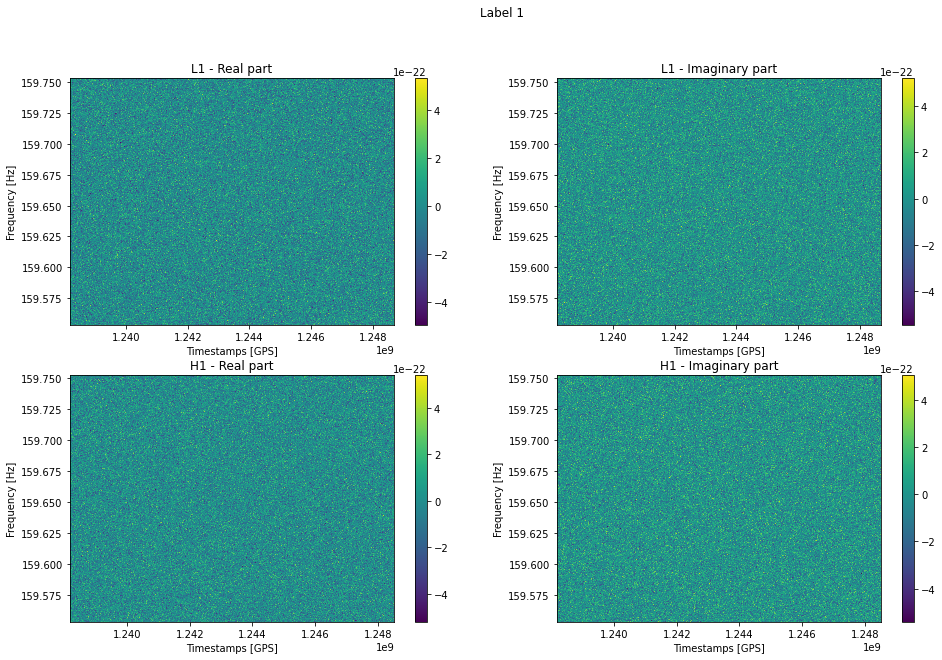

In [22]:
sns.reset_orig() 
data = extract_data_from_hdf5(train_example_with_signal_path, labels_df)
plot_spectograms(data)

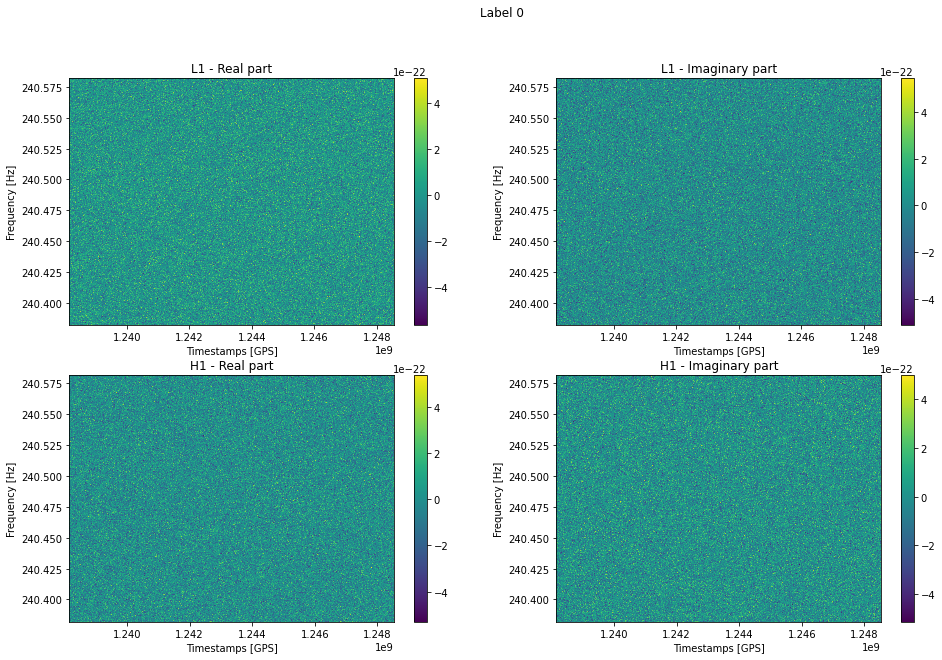

In [23]:
data = extract_data_from_hdf5(train_example_without_signal_path, labels_df)
plot_spectograms(data)

## Visualize Zoom Spectrometer

In [100]:
import torch

In [ ]:
#using the train labels
labels_df = labels_df[labels_df.target >= 0]  # Remove 3 unknowns (target = -1)

In [106]:
class Dataset(torch.utils.data.Dataset):
    """
    dataset = Dataset(data_type, df)

    img, y = dataset[i]
      img (np.float32): 2 x 360 x 128
      y (np.float32): label 0 or 1
    """
    def __init__(self, data_type, df):
        self.data_type = data_type
        self.df = df
        

    def __len__(self):
        return len(self.df)

    def __getitem__(self, i):
        """
        i (int): get ith data
        """
        r = self.df.iloc[i]
        y = np.float32(r.target)
        file_id = r.id

        img = np.empty((2, 360, 128), dtype=np.float32)

        filename = '%s/%s/%s.hdf5' % (di, self.data_type, file_id)
        with h5py.File(filename, 'r') as f:
            g = f[file_id]

            for ch, s in enumerate(['H1', 'L1']):
                a = g[s]['SFTs'][:, :4096] * 1e22  # Fourier coefficient complex64

                p = a.real**2 + a.imag**2  # power
                p /= np.mean(p)  # normalize
                p = np.mean(p.reshape(360, 128, 32), axis=2)  # compress 4096 -> 128

                img[ch] = p

        return img, y

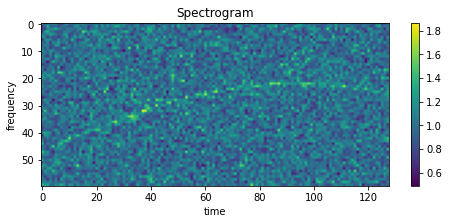

In [107]:
dataset = Dataset('train', df)
img, y = dataset[10]

plt.figure(figsize=(8, 3))
plt.title('Spectrogram')
plt.xlabel('time')
plt.ylabel('frequency')
plt.imshow(img[0, 300:360])  # zooming in for dataset[10]
plt.colorbar()
plt.show()

## Time Domain Dataset Preparation

In [24]:
data_s = extract_data_from_hdf5(train_example_with_signal_path, labels_df)
data_w_s = extract_data_from_hdf5(train_example_without_signal_path, labels_df)
amp1 = data_s['L1_SFTs_amplitudes']
f1 = data_s['freq']
amp2 = data_w_s['L1_SFTs_amplitudes']
f2 = data_w_s['freq']
f_m1 = sum(f1)/len(f1)
f_m2 = sum(f2)/len(f2)
print('Mean of label 1 signal frequency is {}'.format(f_m1))
print('Mean of label 0 signal frequency is {}'.format(f_m2))

Mean of label 1 signal frequency is 159.65305555555554
Mean of label 0 signal frequency is 240.48194444444454


In [25]:
_, xrec1 = signal.istft(amp1, f_m1)
_, xrec2 = signal.istft(amp2, f_m2)
xrec1_r = signal.resample(xrec1, 16707)
xrec2_r = signal.resample(xrec2, 16707)

In [26]:
print('Signal size in frequency domain is {}'.format(amp1[0].shape[0]))
print('Signal size in Time domain is {}'.format(xrec1.shape[0]))
print('Signal size in Time domain(resamples) is {}'.format(xrec1_r.shape[0]))

Signal size in frequency domain is 4655
Signal size in Time domain is 1670786
Signal size in Time domain(resamples) is 16707


As it seems the original time domain sequence size is way too large that's why we will be resampling the signal in order to be able to deal with it during modeling. This will reduce tremendous amount of data informativity but will help the correct architecture to converge and also will be friendly when it comes to computational resources.

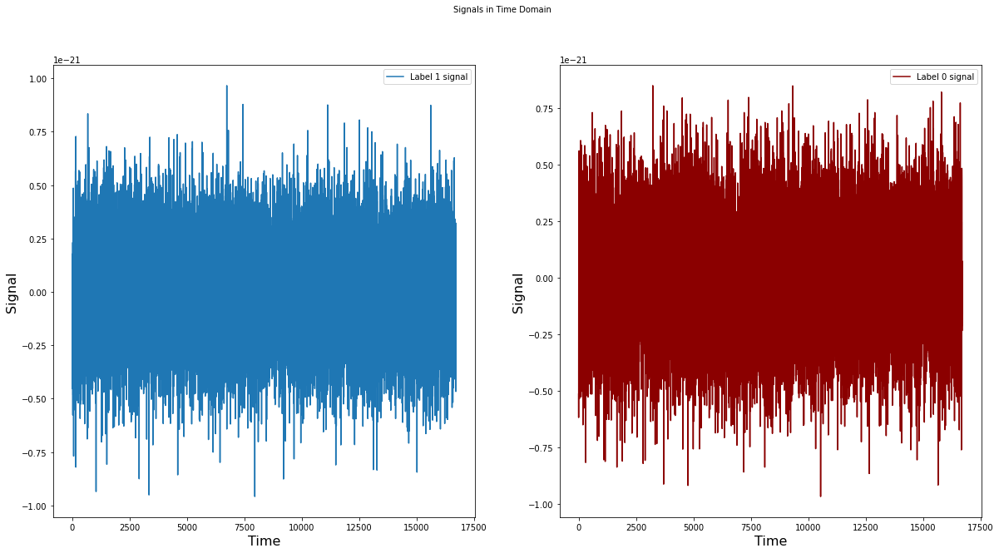

In [27]:
plt.figure(figsize=(20,10))

plt.subplot(1, 2, 1)
plt.suptitle('Signals in Time Domain', fontsize=10)
plt.ylabel('Signal', fontsize=16)
plt.xlabel('Time', fontsize=16)

plt.plot(xrec1_r, label='Label 1 signal')
plt.legend(loc='upper right')

plt.subplot(1, 2, 2)
plt.ylabel('Signal', fontsize=16)
plt.xlabel('Time', fontsize=16)

plt.plot(xrec2_r, label='Label 0 signal', c = 'darkred')

plt.legend(loc='upper right')

In [28]:
%%time
time_df = pd.DataFrame()
for p in tqdm(os.listdir(TRAIN_PATH), total=len(os.listdir(TRAIN_PATH))):
    final_data = dict()
    data = extract_data_from_hdf5(DATA_PATH/'train'/p, labels_df)
    amp1 = data['L1_SFTs_amplitudes']
    amp2 = data['H1_SFTs_amplitudes']
    f = data['freq']
    label = data['label']
    f_m = sum(f)/len(f)
    _, xrec1 = signal.istft(amp1, f_m)
    _, xrec2 = signal.istft(amp2, f_m)
    xrec1_r = signal.resample(xrec1, 16707)
    xrec2_r = signal.resample(xrec2, 16707)
    final_data['L1_resampled_time'] = xrec1_r
    final_data['H1_resampled_time'] = xrec2_r
    final_data['label'] = label
    time_df = time_df.append(final_data, ignore_index=True)

  0%|          | 0/603 [00:00<?, ?it/s]

CPU times: user 8min 30s, sys: 11.6 s, total: 8min 42s
Wall time: 11min 23s


In [29]:
time_df = time_df.sample(frac=1.0)

In [30]:
time_df.shape

(603, 3)

In [31]:
time_df.head()

,L1_resampled_time,H1_resampled_time,label
51,"[-1.3822244e-22, 5.527594e-22, -1.671246e-22, ...","[-4.9169445e-23, -1.2697803e-22, -3.3209018e-2...",1.0
571,"[9.48327e-23, 1.3591033e-22, -1.1012031e-23, -...","[-2.9927106e-22, 1.2051129e-22, -3.7119026e-22...",1.0
507,"[3.1544664e-22, -2.2482003e-22, -5.0763883e-22...","[2.166837e-22, -4.5058217e-23, -4.4878694e-23,...",0.0
90,"[1.1037515e-22, -3.7083397e-22, 2.5989238e-22,...","[-1.26897e-22, 1.6266942e-22, 2.2200421e-22, 1...",0.0
209,"[-1.3998555e-22, -2.2395218e-22, 1.0860915e-22...","[2.4729704e-22, 8.852433e-23, -8.977424e-22, -...",1.0


## Dataset Exploration

In [32]:
%%time
train_df = pd.DataFrame()
for p in tqdm(os.listdir(TRAIN_PATH), total=len(os.listdir(TRAIN_PATH))):
    data = extract_data_from_hdf5_reduced(DATA_PATH/'train'/p, labels_df)
    train_df = train_df.append(data, ignore_index=True)

  0%|          | 0/603 [00:00<?, ?it/s]

CPU times: user 3.75 s, sys: 1.71 s, total: 5.46 s
Wall time: 14.6 s


In [33]:
train_df.head()

,id,freq,L1_ts,H1_ts,label
0,0517ef7fe,"[99.72777777777777, 99.72833333333332, 99.7288...","[1238178603, 1238180403, 1238182203, 123818400...","[1238170914, 1238175422, 1238177222, 123817902...",1.0
1,09531cde3,"[383.4066666666667, 383.40722222222223, 383.40...","[1238171878, 1238173678, 1238175478, 123817727...","[1238166446, 1238168246, 1238170046, 123817184...",1.0
2,067b3fb4b,"[415.4405555555556, 415.4411111111111, 415.441...","[1238174562, 1238188464, 1238190264, 123819206...","[1238177971, 1238179771, 1238184917, 123818671...",1.0
3,4f61f078b,"[247.44722222222222, 247.4477777777778, 247.44...","[1238171750, 1238173550, 1238175350, 123817715...","[1238168490, 1238170290, 1238172090, 123817389...",1.0
4,7c2e38128,"[424.7238888888889, 424.72444444444443, 424.72...","[1238171138, 1238172938, 1238174738, 123817653...","[1238188274, 1238190074, 1238191874, 123819367...",1.0


In [34]:
train_df = train_df.loc[train_df['label'] != -1]

## Frequencies Distribution

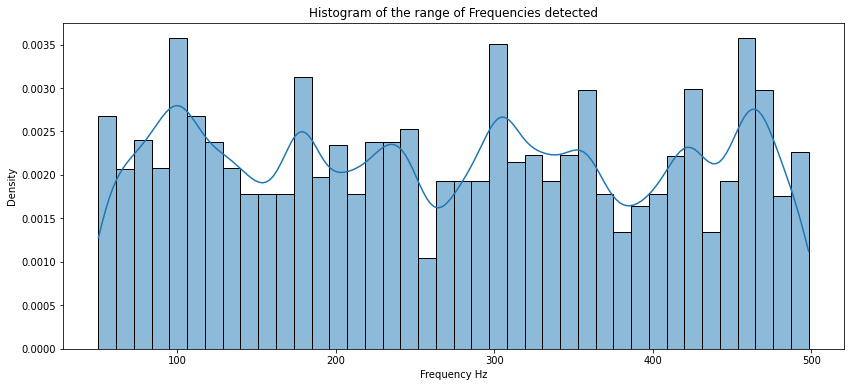

In [35]:
plt.figure(figsize=(14,6))
sns.histplot(x=list(np.hstack(train_df['freq'])), stat="density", common_norm=False, bins=40, kde=True)
plt.title('Histogram of the range of Frequencies detected');
plt.xlabel('Frequency Hz')
plt.show()

## Time stamps Distribution

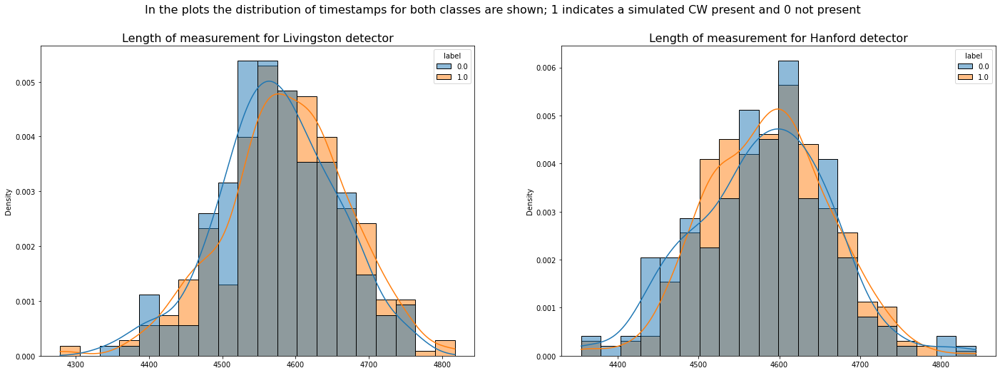

In [36]:
fig, ax = plt.subplots(1,2, figsize=(24,8))
fig.suptitle(f"In the plots the distribution of timestamps for both classes are shown; 1 indicates a simulated CW present and 0 not present", fontsize=16)
sns.histplot(
        x=list(len(i) for i in train_df['L1_ts']),hue=train_df['label'],
        stat="density", common_norm=False, bins=20, ax=ax[0], kde=True).set_title('Length of measurement for Livingston detector', fontsize=16);

sns.histplot(
        x=list(len(i) for i in train_df['H1_ts']),hue= train_df['label'], 
        stat="density", common_norm=False, bins=20, ax=ax[1], kde=True).set_title('Length of measurement for Hanford detector', fontsize=16);

In [37]:
def test_record(id):
    ma_sft, freqs = get_MA_SFT(id)

    results = {'freq' : freqs[0]}
    
    for detector in ['L1', 'H1']:
        results[detector] = []
        for row in range(2):
            # Calculate mean value for each frequency or for each time interval
            x = np.mean(ma_sft[detector], axis=row)
            k2, p = stats.normaltest(x)
            results[detector].append(p)
            
    return [results['freq']] + results['L1'] + results['H1']

In [38]:
# Add zero-filled columns to our dataframe
columns = ['freq', 'L1_time', 'L1_freq', 'H1_time', 'H1_freq']
df[columns] = 0

In [39]:
def print_criteria_statistics(ds, treshold=0.01):
    # A set of criteria for every column
    criteria = [df[col]<treshold for col in columns[1:]]
    
    # A dict of criteria for datasets
    criteria_ds = {'train' : df.target != 0.5, 'test': df.target == 0.5}

    # Total length
    total = len(df[criteria_ds[ds]])

    print(f'Dataset = {ds}; length = {total}')
    print('-'*80)

    for n, col in enumerate(columns[1:]):
        l = len(df[criteria_ds[ds] & criteria[n]])
        print(f'{col}  is not gauss for\t{l}/{total},\twhich is {100*l/total:.3}%')

    print('-'*80)

    l = len(df[criteria_ds[ds] & criteria[0] & criteria[2]])
    print(f'Time L&H is not gauss for\t{l}/{total},\twhich is {100*l/total:.3}%')

    l = len(df[criteria_ds[ds] & criteria[1] & criteria[3]])
    print(f'Freq L&H is not gauss for\t{l}/{total},\twhich is {100*l/total:.3}%')

    print('-'*80)

    l = len(df[criteria_ds[ds] & (criteria[0] | criteria[2])])
    print(f'Time L|H is not gauss for\t{l}/{total},\twhich is {100*l/total:.3}%')

    l = len(df[criteria_ds[ds] & (criteria[1] | criteria[3])])
    print(f'Freq L|H is not gauss for\t{l}/{total},\twhich is {100*l/total:.3}%')

In [40]:
print_criteria_statistics(ds = 'train')

print('\n')

print_criteria_statistics(ds = 'test')

Dataset = train; length = 600
--------------------------------------------------------------------------------
L1_time  is not gauss for	600/600,	which is 1e+02%
L1_freq  is not gauss for	600/600,	which is 1e+02%
H1_time  is not gauss for	600/600,	which is 1e+02%
H1_freq  is not gauss for	600/600,	which is 1e+02%
--------------------------------------------------------------------------------
Time L&H is not gauss for	600/600,	which is 1e+02%
Freq L&H is not gauss for	600/600,	which is 1e+02%
--------------------------------------------------------------------------------
Time L|H is not gauss for	600/600,	which is 1e+02%
Freq L|H is not gauss for	600/600,	which is 1e+02%


Dataset = test; length = 7975
--------------------------------------------------------------------------------
L1_time  is not gauss for	7975/7975,	which is 1e+02%
L1_freq  is not gauss for	7975/7975,	which is 1e+02%
H1_time  is not gauss for	7975/7975,	which is 1e+02%
H1_freq  is not gauss for	7975/7975,	which is 1

**Stationarity.**
In the train set we never have non stationary noise on both detectors simultaniously, and only in 3.5% we have it on one of the detectors. In the test set we have it on both detectors in 11.2% and on at least one of them in 21.3%.

**Frequency "artifacts"**
These artifacts could be potential signals or a glitches, or an interferences. In the train set we have it in 7% on the both detectors and in 15% on at least one of them. In the test the corresponding values are 1.9% and 8.8%.

Now let's set even less value for the treshold and look, what happens.

In [41]:
print_criteria_statistics(ds = 'train', treshold=1e-5)

print('\n')

print_criteria_statistics(ds = 'test', treshold=1e-5)

Dataset = train; length = 600
--------------------------------------------------------------------------------
L1_time  is not gauss for	600/600,	which is 1e+02%
L1_freq  is not gauss for	600/600,	which is 1e+02%
H1_time  is not gauss for	600/600,	which is 1e+02%
H1_freq  is not gauss for	600/600,	which is 1e+02%
--------------------------------------------------------------------------------
Time L&H is not gauss for	600/600,	which is 1e+02%
Freq L&H is not gauss for	600/600,	which is 1e+02%
--------------------------------------------------------------------------------
Time L|H is not gauss for	600/600,	which is 1e+02%
Freq L|H is not gauss for	600/600,	which is 1e+02%


Dataset = test; length = 7975
--------------------------------------------------------------------------------
L1_time  is not gauss for	7975/7975,	which is 1e+02%
L1_freq  is not gauss for	7975/7975,	which is 1e+02%
H1_time  is not gauss for	7975/7975,	which is 1e+02%
H1_freq  is not gauss for	7975/7975,	which is 1

We can see, that now all train signals look stationary (speaking corectly, we don't reject our null hypothesis), and 18.5% of test signals not. But the most interesting is that frequency artifacts are not independent on both detectors. If it was so, than, for test set, we'll have 0.0176*0.0406 = 0.07% of not gauss 'Freq L&H', but we have 1.17%. So, almost all of the records with not gauss 'Freq L&H' (we have selected 93 of them) are likely to contain a signal.

Let's get their exact ids and look at them to see, if it's true.

Candidate 0


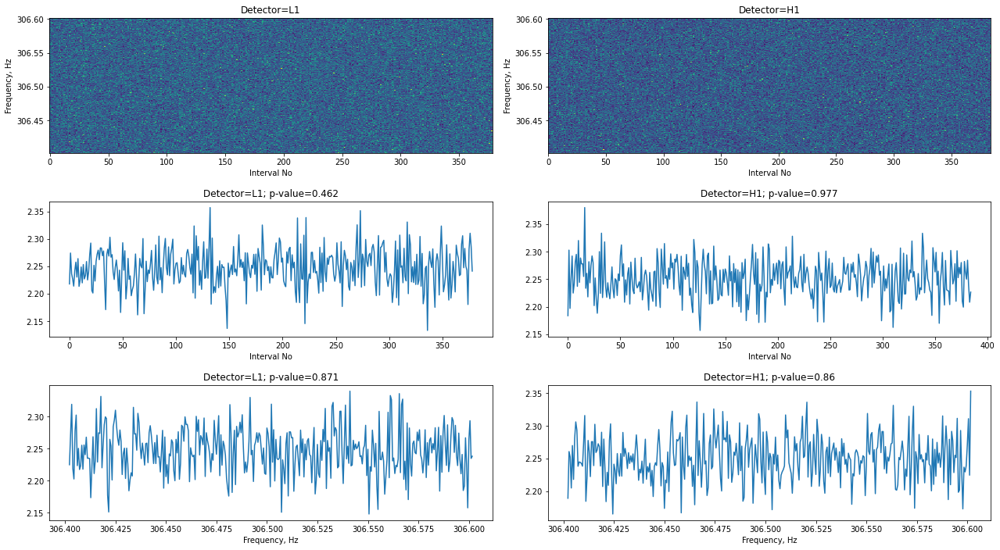

Candidate 1


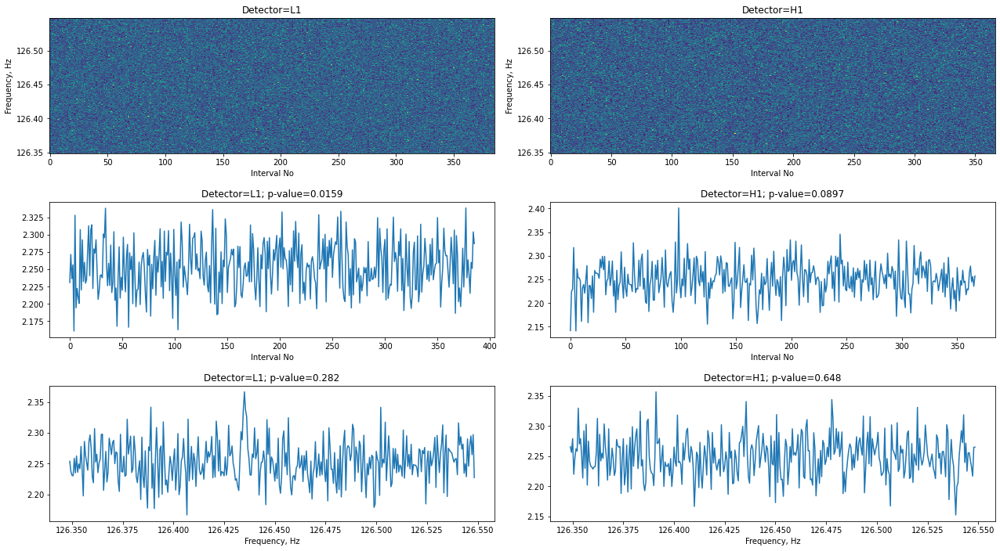

Candidate 2


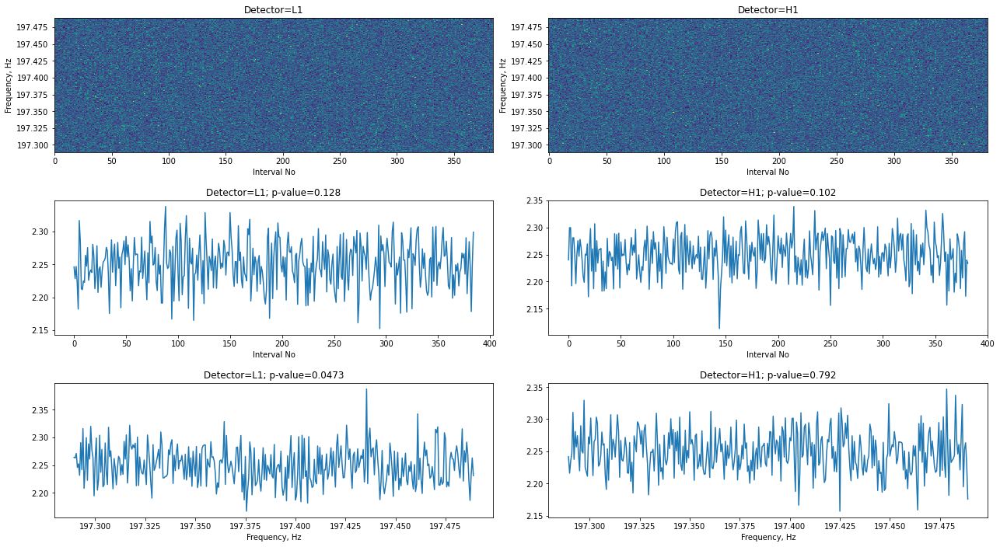

Candidate 3


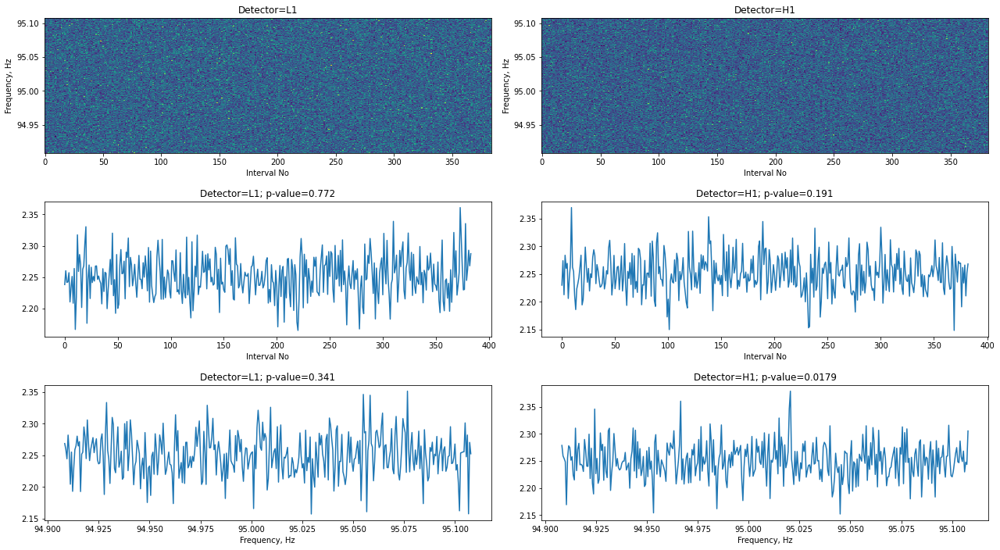

Candidate 4


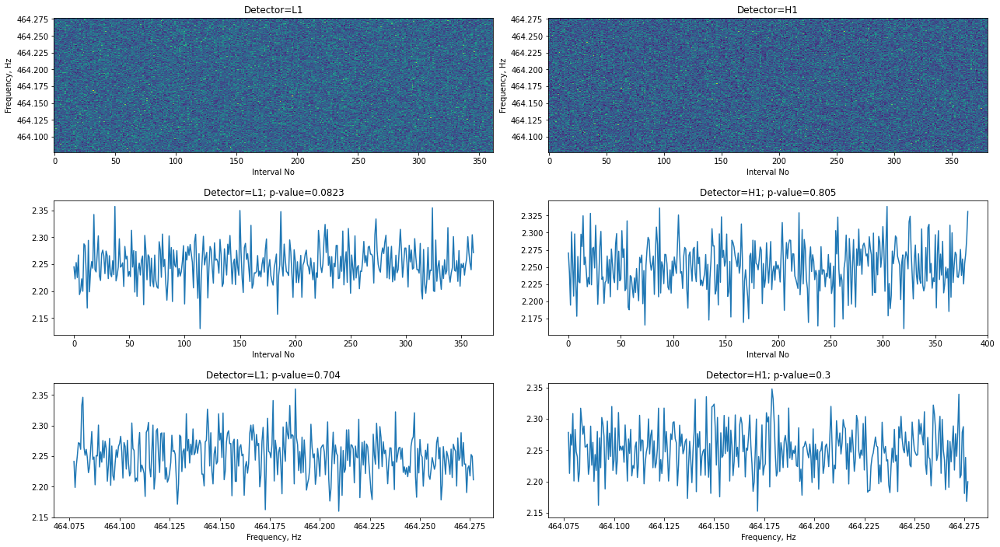

In [42]:
treshold = 1e-5

candidates = df[(df.target==0.5) & (df.L1_freq<treshold) & (df.H1_freq<treshold)].index.tolist()

for n in candidates[:5]:
    print(f'Candidate {n}')
    test_record_view(id=n)

## Simulating gravitational waves and evaluating their detectability in Python

In [43]:
# Code by Geir Drange https://www.kaggle.com/code/mistag/reverse-engineering-create-clean-gw-signals

# Parameters:
# logMC: system mass (0.0-2.0)
# q: mass ratio (0.1-1.0)
# D: distance (Mpc)
# merger_type: 'BH'=binary black hole merger, 'NS'=binary neutron star merger
# flow: low frequency (Hz) 
def gen_gw(logMc=1.4, q=0.8, D=100.0, flow=10.0, merger_type='BH'):
    M, eta = ins.get_M_and_eta(logMc=logMc,q=q)
    start_x = ins.startx(M,flow)
    end_x = ins.endx(eta,merger_type)
    x, xtimes, dt = ins.PN_parameter_integration(start_x,end_x,M,eta)
    realtimes = ins.inspiral_time_conversion(xtimes,M)
    i_phase, omega, freq = ins.inspiral_phase_freq_integration(x,dt,M)
    r, rdot = ins.radius_calculation(x,M,eta)
    A1, A2 = ins.a1_a2_calculation(r,rdot,omega,D,M,eta)
    i_Aorth, i_Adiag = ins.inspiral_strain_polarisations(A1,A2,i_phase)
    i_amp = ins.inspiral_strain_amplitude(i_Aorth,i_Adiag)
    i_time = realtimes
    i_omega = omega
    sfin, wqnm = me1.quasi_normal_modes(eta)
    alpha, b, C, kappa = me1.gIRS_coefficients(eta,sfin)
    fhat, m_omega = me1.merger_freq_calculation(wqnm,b,C,kappa)
    fhatdot = me1.fhat_differentiation(fhat)
    m_time = me1.merger_time_conversion(M)
    min_switch_ind = mat.min_switch_ind_finder(i_time,i_omega,m_time,m_omega)
    final_i_index = mat.final_i_index_finder(min_switch_ind,i_omega,m_omega)
    time_offset = mat.time_offset_finder(min_switch_ind,final_i_index,i_time,m_time)
    i_m_time, i_m_omega = mat.time_frequency_stitching(min_switch_ind,final_i_index,time_offset,i_time,i_omega,m_time,m_omega)
    i_m_freq = mat.frequency_SI_units(i_m_omega,M)
    m_phase = me2.merger_phase_calculation(min_switch_ind,final_i_index,i_phase,m_omega)
    i_m_phase = me2.phase_stitching(final_i_index,i_phase,m_phase)
    m_amp = me2.merger_strain_amplitude(min_switch_ind,final_i_index,alpha,i_amp,m_omega,fhat,fhatdot)
    i_m_amp = me2.amplitude_stitching(final_i_index,i_amp,m_amp)
    m_Aorth, m_Adiag = me2.merger_polarisations(final_i_index,m_amp,m_phase,i_Aorth)
    i_m_Aorth, i_m_Adiag = me2.polarisation_stitching(final_i_index,i_Aorth,i_Adiag,m_Aorth,m_Adiag)
    return np.array(i_m_time), np.array(i_m_Aorth), np.array(i_m_Adiag), np.array(i_m_freq)

"The function returns two waves that represent orthogonal/diagonal waves. The output timescale that is returned is non-linear, so to convert these signals into uniform sampled signals as in the dataset, we need to resample. The function below will resample the gravitational wave signals to 2048Hz. It is crude though, based on nearest sample, but good enough for studying spectrums. Interpolation would be more proper."

In [44]:
SR = 2048 # target sample rate (Hz)
# Parameters:
# dt: time series
# amp: amplitude signal
# seg: output sequence length (seconds)
def resample(dt, amp, seg=2.0):
    end = dt[-1]
    start = end - seg
    d = np.zeros(int(SR*seg))
    for i in range((int(SR*seg))):
        t = start + i/SR
        d[i] = amp[np.where(dt == dt[np.abs(dt-t).argmin()])[0][0]]
    return d

In [45]:
def plot_sig(dt, sig1, sig2=None, seg=2.0):
    end = dt[-1]
    start = end - seg
    plt.figure(1)
    plt.plot(dt, sig1)
    peak = np.max(np.abs(sig1))
    plt.axis([start,end,np.min(sig1)-peak/10,np.max(sig1)+peak/10])
    if sig2 is not None:
        plt.plot(dt, sig2)
    plt.xlabel('Time (s)')
    plt.ylabel('Strain amplitude')


### Test signal generation

In [46]:
m_time, m_Aorth, m_Adiag, m_freq = gen_gw(logMc=1.4, q=0.2)

### How Gravitational waves get detected

"When a gravitational wave passes by Earth, it squeezes and stretches space. LIGO can detect this squeezing and stretching. Each LIGO observatory has two “arms” that are each more than 2 miles (4 kilometers) long. A passing gravitational wave causes the length of the arms to change slightly. The observatory uses lasers, mirrors, and extremely sensitive instruments to detect these tiny changes."

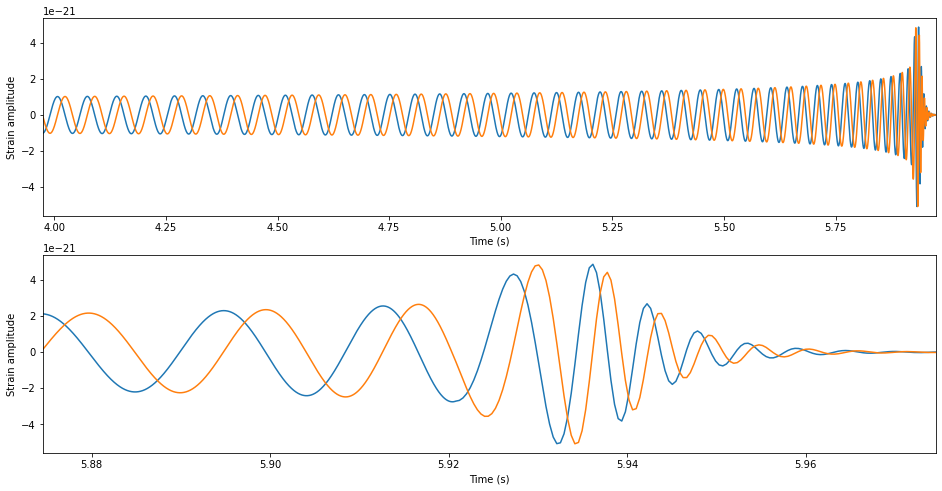

In [47]:
fig = plt.figure(figsize=(16,8))
plt.subplot(2, 1, 1)
plot_sig(m_time, m_Aorth, m_Adiag, seg=2)
plt.subplot(2, 1, 2)
plot_sig(m_time, m_Aorth, m_Adiag, seg=.1)

### Resample the signal to 2048Hz (only the orthogonal part)

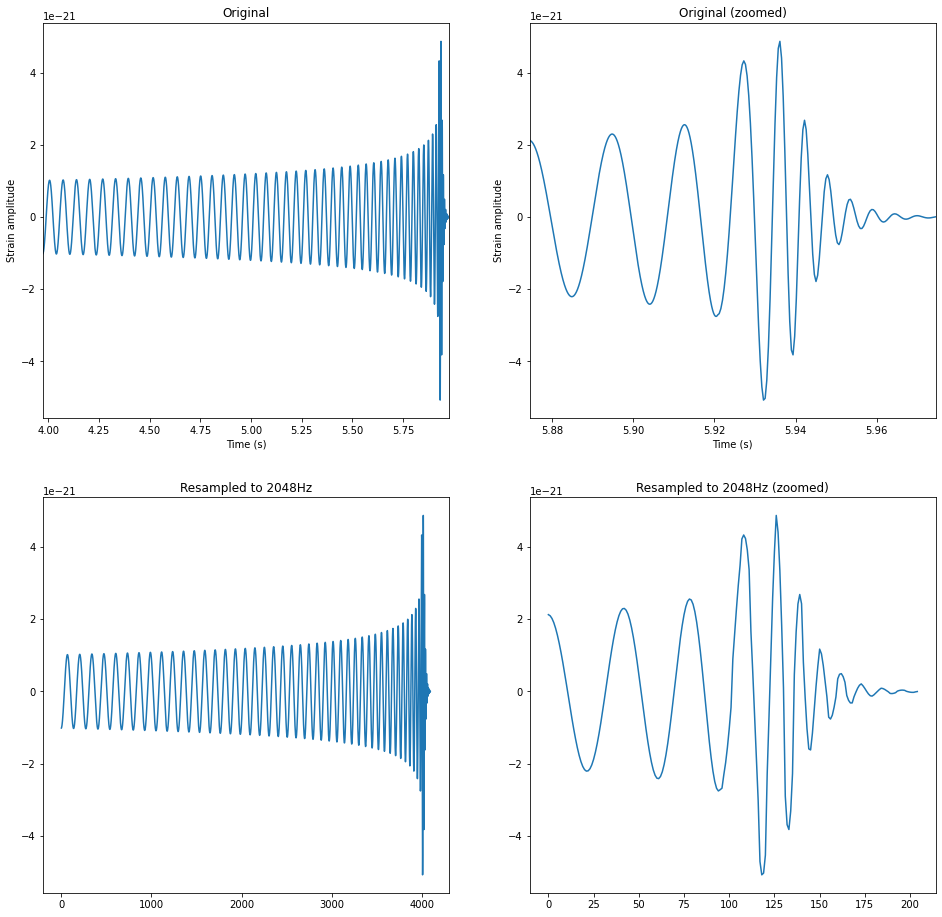

In [48]:
d1 = resample(m_time, m_Aorth, 2.0)

fig = plt.figure(figsize=(16,16))
plt.subplot(2, 2, 1)
plot_sig(m_time, m_Aorth, seg=2)
plt.title('Original')
plt.subplot(2, 2, 2)
plot_sig(m_time, m_Aorth, seg=.1)
plt.title('Original (zoomed)')
plt.subplot(2, 2, 3)
plt.plot(d1)
plt.title('Resampled to 2048Hz')
plt.subplot(2, 2, 4)
plt.plot(d1[-205:])
plt.title('Resampled to 2048Hz (zoomed)');

### Visualizing Frequency Vector

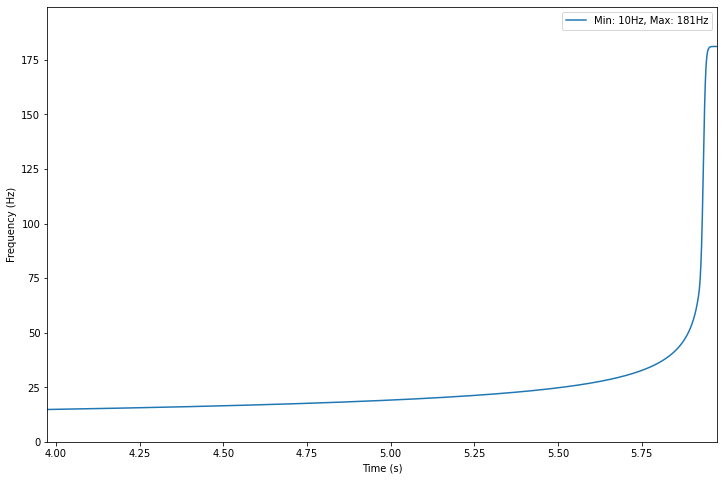

In [49]:
fig, ax = plt.subplots(figsize=(12,8))
plt.plot(m_time, m_freq, label="Min: {}Hz, Max: {}Hz".format(int(np.min(m_freq)), int(np.max(m_freq))))
peak = np.max(np.abs(m_freq))
plt.axis([m_time[-1] - 2.0 if m_time[-1] >= 2.0 else m_time[0], m_time[-1], 0 , np.max(m_freq)+peak/10])
ax.legend()
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)');

### Visualizing spectrum in frequency domain using Constant-Q transform

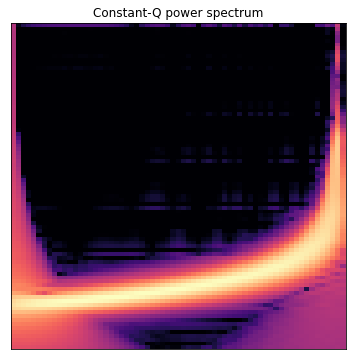

In [50]:
hop_length = 64
C = np.abs(librosa.cqt(d1/np.max(d1), sr=SR, hop_length=hop_length, fmin=8, filter_scale=0.8, bins_per_octave=12))
fig, ax = plt.subplots(figsize=(6,6))
img = librosa.display.specshow(librosa.amplitude_to_db(C, ref=np.max),
                               sr=SR*2, hop_length=hop_length, bins_per_octave=12, ax=ax)
ax.set_title('Constant-Q power spectrum');

### Amplitude vs. Distance(Inverse square law verification)

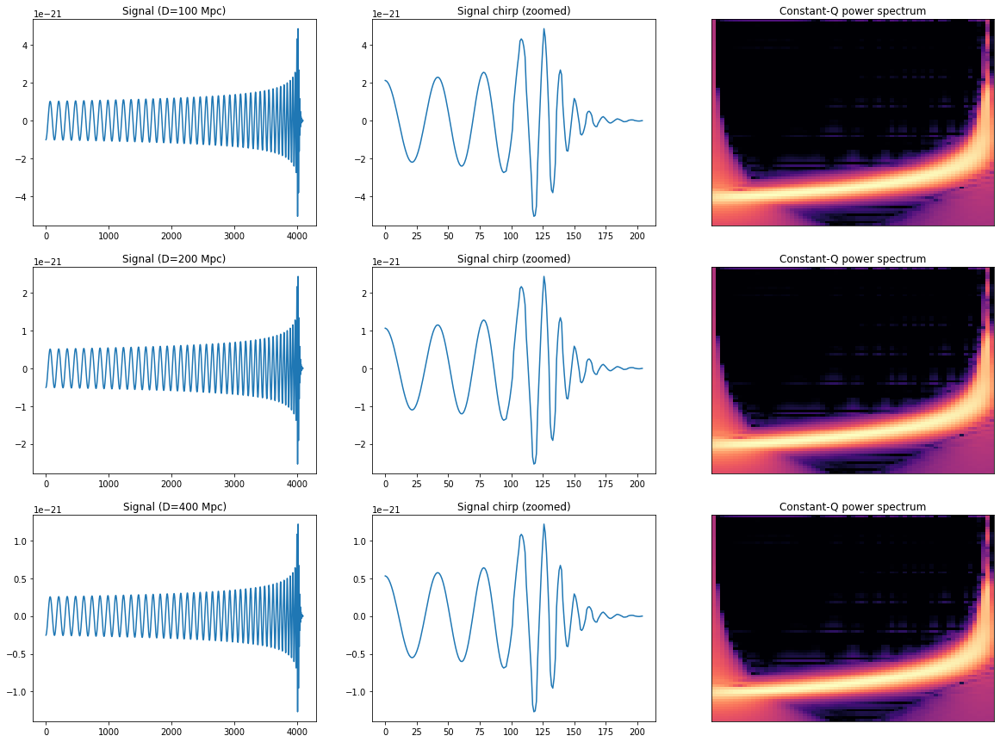

In [51]:
hop_length = 64

fig = plt.figure(figsize=(20,15))
dist = [100., 200., 400.]
for m in range(len(dist)):
    m_time, m_Aorth, _, m_freq = gen_gw(logMc=1.4, q=0.2, D=dist[m])
    rd = resample(m_time, m_Aorth, 2.0)
    # time series
    ax = plt.subplot(len(dist), 3, 1+m*3)
    plt.plot(rd)
    plt.title('Signal (D={} Mpc)'.format(int(dist[m])))
    # zoomed times series (chirp)
    ax = plt.subplot(len(dist), 3, 2+m*3)
    plt.plot(rd[-205:])
    plt.title('Signal chirp (zoomed)')
    # Q-Transform
    ax = plt.subplot(len(dist), 3, 3+m*3)
    if m == 0:
        smax = np.max(rd)
    C = np.abs(librosa.cqt(rd/smax, sr=SR, hop_length=hop_length, fmin=8, filter_scale=0.8, bins_per_octave=12))
    if m == 0:
        Cmax = np.max(C)
    img = librosa.display.specshow(librosa.amplitude_to_db(C, ref=Cmax), # was np.max
                                   sr=SR*2, hop_length=hop_length, bins_per_octave=12, ax=ax)
    ax.set_title('Constant-Q power spectrum');

## Gravitational wave signal generation

In [52]:
# Generate signals with parameters drawn from a specific population
num_signals = 2

# These parameters describe background noise and data format
writer_kwargs = {
                "tstart": 1238166018,
                "duration": 4 * 30 * 86400,  
                "detectors": "H1,L1",        
                "sqrtSX": 1e-23,          
                "Tsft": 1800,             
                "SFTWindowType": "tukey", 
                "SFTWindowBeta": 0.01,
               }

In [53]:
# This class allows us to sample signal parameters from a specific population.
# Implicitly, sky positions are drawn uniformly across the celestial sphere.
# PyFstat also implements a convenient set of priors to sample a population
# of isotropically oriented neutron stars.
signal_parameters_generator = pyfstat.AllSkyInjectionParametersGenerator(
    priors={
        "tref": writer_kwargs["tstart"],
        "F0": {"uniform": {"low": 100.0, "high": 100.1}},
        "F1": lambda: 10**stats.uniform(-12, 4).rvs(),
        "F2": 0,
        "h0": lambda: writer_kwargs["sqrtSX"] / stats.uniform(1, 10).rvs(),
        **pyfstat.injection_parameters.isotropic_amplitude_priors,
    },
)

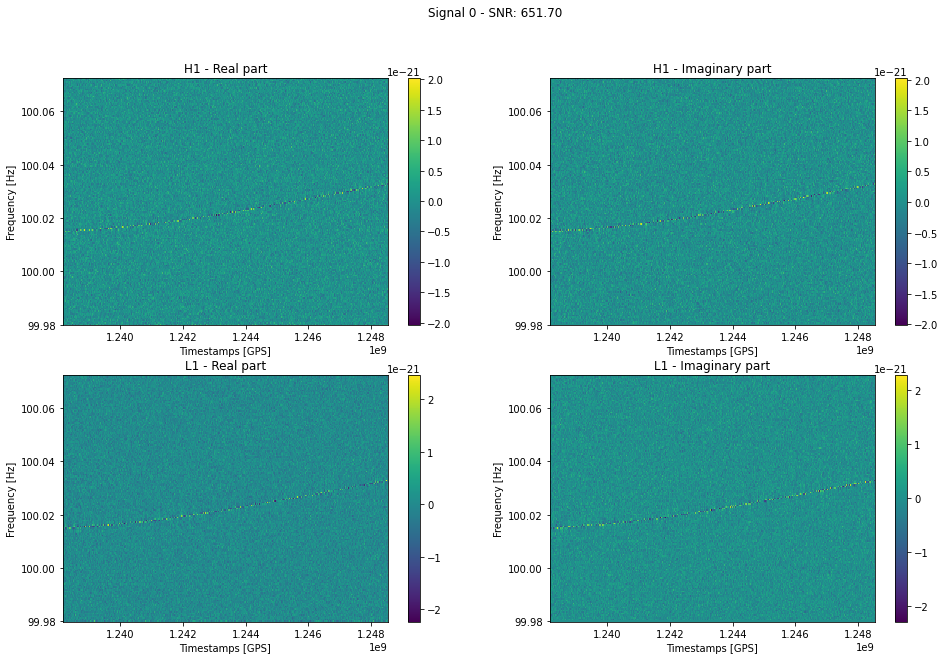

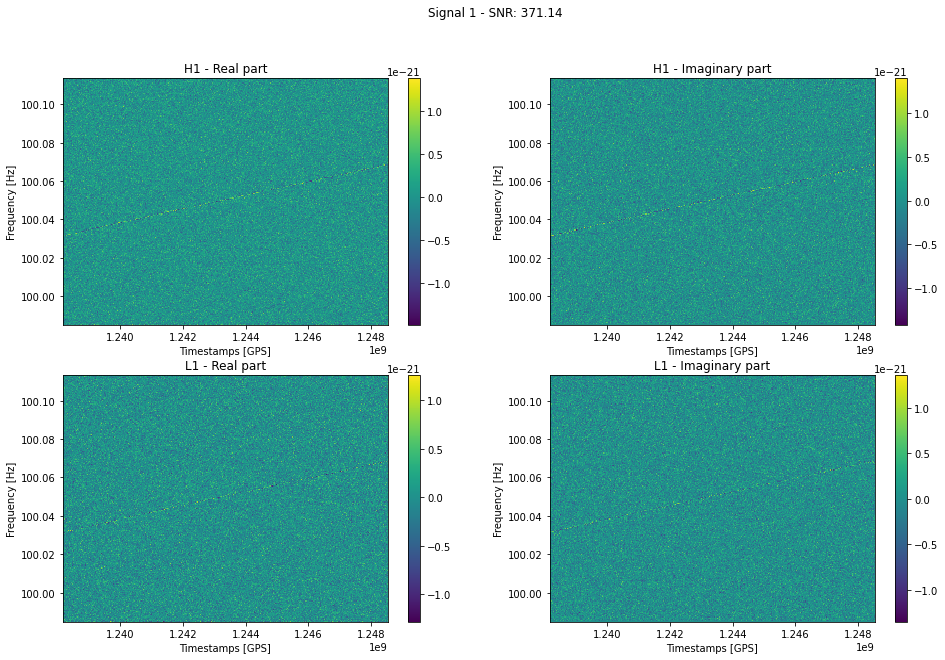

In [54]:
snrs = np.zeros(num_signals)

for ind in range(num_signals):

    # Draw signal parameters.
    # Noise can be drawn by setting `params["h0"] = 0
    params = signal_parameters_generator.draw()
    writer_kwargs["outdir"] = f"PyFstat_example_data_ensemble/Signal_{ind}"
    writer_kwargs["label"] = f"Signal_{ind}"
    
    writer = pyfstat.Writer(**writer_kwargs, **params)
    writer.make_data()
    
    # SNR can be compute from a set of SFTs for a specific set
    # of parameters as follows:
    snr = pyfstat.SignalToNoiseRatio.from_sfts(
        F0=writer.F0, sftfilepath=writer.sftfilepath
    )
    squared_snr = snr.compute_snr2(
        Alpha=writer.Alpha, 
        Delta=writer.Delta,
        psi=writer.psi,
        phi=writer.phi, 
        h0=writer.h0,
        cosi=writer.cosi
    )
    snrs[ind] = np.sqrt(squared_snr)
    
    # Data can be read as a numpy array using PyFstat
    frequency, timestamps, amplitudes = pyfstat.utils.get_sft_as_arrays(
        writer.sftfilepath
    )
    
    fig, ax = plt.subplots(2, 2, figsize=(16, 10))
    fig.suptitle(f"Signal {ind} - SNR: {snrs[ind]:.2f}")
    for d_ind, detector in enumerate(amplitudes.keys()):
        ax[d_ind][0].set(xlabel="Timestamps [GPS]",
                         ylabel="Frequency [Hz]",
                         title=f"{detector} - Real part")
        ax[d_ind][1].set(xlabel="Timestamps [GPS]",
                         ylabel="Frequency [Hz]",
                         title=f"{detector} - Imaginary part")
        
        c0 = ax[d_ind][0].pcolormesh(timestamps[detector], frequency,
                                     amplitudes[detector].real)
        c1 = ax[d_ind][1].pcolormesh(timestamps[detector], frequency,
                                     amplitudes[detector].imag)
        
        fig.colorbar(c0, ax=ax[d_ind][0])
        fig.colorbar(c1, ax=ax[d_ind][1])
    plt.show()